# **Group M (Mohamed Boutaleb, Francesco Moro)**

# Machine Learning Project - Diamond Analysis

## Introduction
In this notebook will be performed the analysis of the [diamond dataset](https://www.kaggle.com/shivam2503/diamonds), a collection of almost **54,000** diamonds.

In [1]:
### Keeping safe from any disaster :) ###
%autosave 30

# **4C's Diamond**

<img src="./img/4cs.png" alt="drawing" width="400"/>

[Image source: Diamond Education Learning](https://www.youtube.com/watch?v=qJs6P7ChGd8)


### In a nutshell, to understand how much a diamond is worth, we should start with the basics, i.e. the 4 C's (CARAT, CLARITY, COLOR, CUT). These explain very well the quality of a diamond: 
* <span style="color:red"><b>Carat</span>: Carat is the weight of the diamond. Bigger the diamond, rare to find them.
* <span style="color:red"><b>Clarity</span>: Clarity of the diamond is intrusions in the diamond, which could be internal flaws, external defects.
* <span style="color:red"><b>Color</span>: Color of the diamond is self explinary, and on scale of AtoZ, A is best and colorless, where as Z is worst and yellowish color. The colorless diamonds are rare and costly.
* <span style="color:red"><b>Cut</span>: Cut of the diamond is about physical dimensions of the diamond. It determine the light amount enter into the diamond. Anotomy of the diamond is an important parameter.



# **Cut and Components**

<div style="display: flex;"><img src="./img/Diamond-Cut.jpg" alt="drawing" width="600"/> <img src="./img/Diamond-Components.jpg" alt="drawing" width="600"/></div>

### There are several things to consider to see in a diamond. Few such is **table%**, **depth%** and **cuts**. Diamond anotomy is given it the cut of the diamond infographic in the above image.
All the basic information about the diamond cut are givn above.
Side view of the diamond show the terminology and meaning of his features.
Thus table length, table width, diamond depth, depth%, and table% are very important features to determine the price of a diamond.

## **Libraries used**
For these analyses we used some libraries covered during the course and partly others based on their documentation. Below is the list:
* **numpy**
* **pandas**
* **plotly**
* **scikit learn**
* **ml_utilities**
* **ml_visualization**

* **seaborn**
* **matplotlib**

In [2]:
### Imports ###
import numpy as np
import pandas as pd

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

from sklearn.dummy import DummyClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression 
from sklearn.ensemble import RandomForestRegressor

from sklearn.model_selection import GridSearchCV, KFold, cross_val_score

import seaborn as sns
import matplotlib.pyplot as plt

import scipy.stats as st

import ml_utilities
import ml_visualization

## **Reading the dataset**
In order to properly import the dataset you need to:
* Download the zipper from [here](https://www.kaggle.com/shivam2503/diamonds)
* Extract it
* Move it into the current directory `./`.

In [3]:
### Reading .csv dataset ###
dfName = "diamonds.csv"
df = pd.read_csv(dfName)

## **Preliminary analysis**
### What are the columns?

In [4]:
### Describing the df characteristics ###
df.describe()

,Unnamed: 0,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,26970.500000,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,15571.281097,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,1.000000,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,13485.750000,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,26970.500000,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,40455.250000,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,53940.000000,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [5]:
### How many non-null fields are there? ###
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53940 non-null  float64
 2   cut         53940 non-null  object 
 3   color       53940 non-null  object 
 4   clarity     53940 non-null  object 
 5   depth       53940 non-null  float64
 6   table       53940 non-null  float64
 7   price       53940 non-null  int64  
 8   x           53940 non-null  float64
 9   y           53940 non-null  float64
 10  z           53940 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 4.5+ MB


In [6]:
df.head(1)

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43


## **Dropping and remapping columns**

In [7]:
### Dropping unnecessary column. Additional index ###
df.drop('Unnamed: 0', axis=1, inplace=True)

df_mapped=df.copy()

### Remapping all necessary columns
df_mapped['color'] = df['color'].replace(['J','I','H','G','F','E','D'],[1,2,3,4,5,6,7])
df_mapped['cut'] = df['cut'].replace(['Fair','Good','Very Good','Premium','Ideal'],[1,2,3,4,5])
df_mapped['clarity'] = df['clarity'].replace(['I3','I2','I1','SI2','SI1','VS2','VS1','VVS2','VVS1','IF'],[1,2,3,4,5,6,7,8,9,10])

## **First question we asked ourselves**
### Is there a correlation between price and carats?

In [8]:
px.scatter(x=df["carat"], y=df["price"])

## **How do the other attributes of the diamond infer price?**

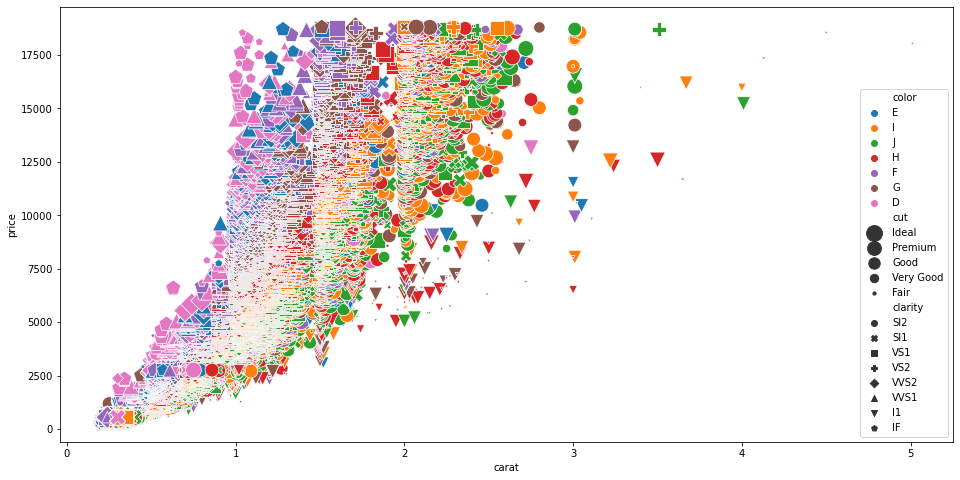

In [9]:
plt.figure(figsize=(16,8))
sns.scatterplot(data=df, x="carat", y="price", hue="color",size="cut", style="clarity", sizes=(10,250))
plt.show()

## **How do price quantiles change according to attributes?**
### We considered the attributes that should infer more

In [10]:
allBoxes=[]
allBoxes.append(px.box(data_frame=df_mapped,x="clarity",y="price") )
allBoxes.append(px.box(data_frame=df_mapped,x="cut", y="price"))
allBoxes.append(px.box(data_frame=df_mapped,x="color", y="price"))
for i in allBoxes:
    i.show()

## **What is the distribution of the diamonds in this Dataset according to attributes?**

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000206BF552E20>,
      dtype=object)

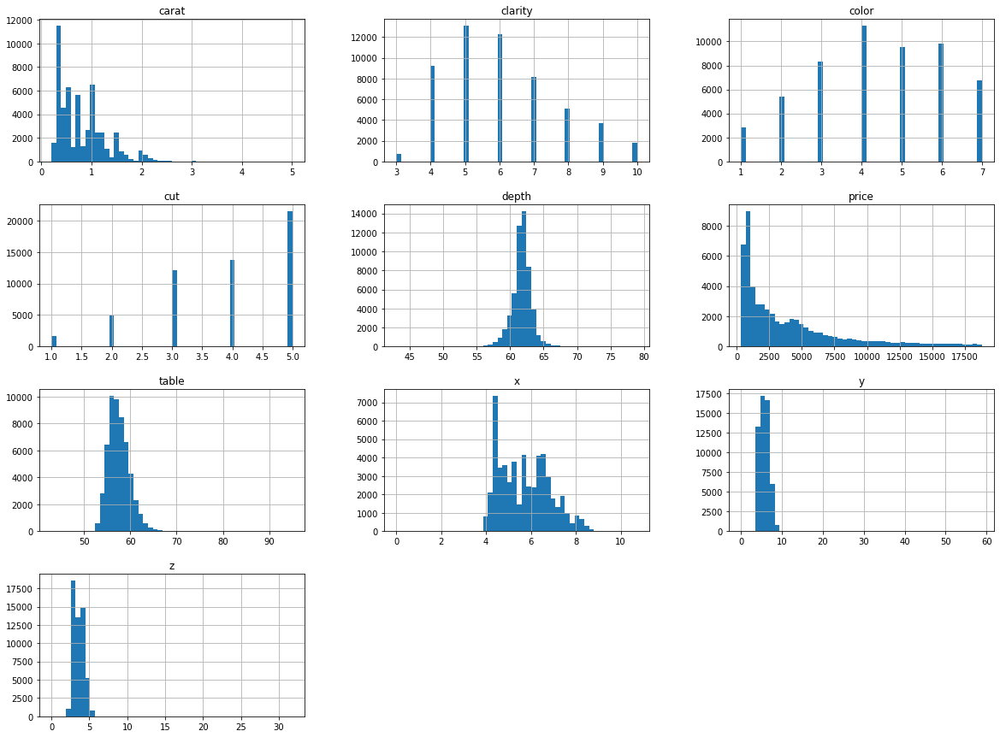

In [11]:
### distribution for all the features ###
df_mapped.hist(bins=50, figsize=(20,15))

# **Linear Regression**

## Computing correlation matrix to detect some linear patterns

In [12]:
### calculation of the correlation coefficient between price and all other fields ###
corr_matrix = df_mapped.corr()

print(corr_matrix["price"].sort_values(ascending = False))

price      1.000000
carat      0.921591
x          0.884435
y          0.865421
z          0.861249
table      0.127134
depth     -0.010647
cut       -0.053491
clarity   -0.146800
color     -0.172511
Name: price, dtype: float64


Text(0.5, 1.0, 'Correlation matrics')

findfont: Font family ['Sherif'] not found. Falling back to DejaVu Sans.


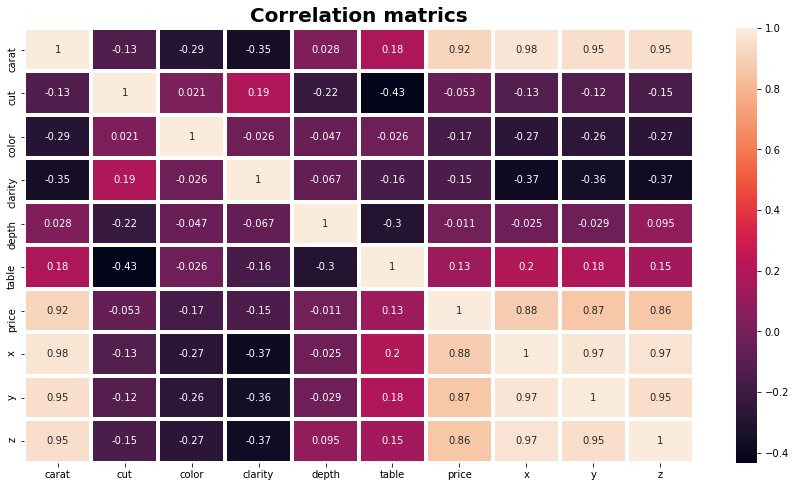

In [13]:
#Correlation with Price column
fig=plt.figure(figsize=(15,8))
sns.heatmap(df_mapped.corr(), linewidths=3, annot=True)
plt.title("Correlation matrics", family='Sherif', size=20, weight='bold')

In [14]:
#split dataset in features and target variable
feature_cols = ['clarity', 'carat', 'cut', 'color','depth','table','x', 'y', 'z']
X = df_mapped[feature_cols] # Features
y = df_mapped.price.astype('float64') # Target variable

In [15]:
# split X and y into training and testing sets
valid_portion = 0.5
split_random = True

if split_random:
    # Split random to train, test set
    train_x, validation_x, train_y, validation_y = train_test_split(X, y, test_size=valid_portion, random_state=1)
else:    
    # Split temporale
    train_size = round((1-valid_portion) * len(X))
    train_x = X[0:train_size,:]
    validation_x = X[train_size:-1,:]
    train_y = y[0:train_size]
    validation_y = y[train_size:-1]

## **Start with RandomForest to check efficiency**

In [16]:
# Addestramento di un RandomForestRegressor
rndfor_reg = RandomForestRegressor()
rndfor_reg.fit(train_x, train_y)

# Ottenimento delle predizioni
train_y_predicted = rndfor_reg.predict(train_x)

# Calcolo del RMSE
rmse = np.sqrt(mean_squared_error(train_y, train_y_predicted))
print('Train RMSE: ', rmse) 

# Ottenimento delle predizioni (validation) e calcolo RMSE
validation_y_predicted = rndfor_reg.predict(validation_x)
rmse = np.sqrt(mean_squared_error(validation_y, validation_y_predicted))
print('Validation RMSE: ', rmse)
print('R2 score:', rndfor_reg.score(validation_x, validation_y))

Train RMSE:  210.76777063594204
Validation RMSE:  557.0141337401168
R2 score: 0.980098285055509


## **Check if the LinearRegressor can do better**

In [17]:
# Addestramento di un LinearRegression
lin_reg = LinearRegression()
lin_reg.fit(train_x, train_y)

# Ottenimento delle predizioni
train_y_predicted = lin_reg.predict(train_x)

# Calcolo del RMSE
rmse = np.sqrt(mean_squared_error(train_y, train_y_predicted))
print('Train RMSE: ', rmse) 

# Ottenimento delle predizioni (validation) e calcolo RMSE
validation_y_predicted = lin_reg.predict(validation_x)
rmse = np.sqrt(mean_squared_error(validation_y, validation_y_predicted))
print('Validation RMSE: ', rmse)

Train RMSE:  1229.2485789721898
Validation RMSE:  1204.5442615091756


In [18]:
print('R2 score:', lin_reg.score(validation_x, validation_y))

R2 score: 0.9069313108306197


## **Doing a K-Fold Cross-Validation to check if it affects RMSE optimisation**

In [19]:
# Ottimizzazione con Cross-Validation
reg = RandomForestRegressor() 

param_grid = [{'n_estimators': [10, 50, 100], 'max_depth': [None, 2, 3], 'random_state': [1234]}]

# Con shuffle=False si otterranno fold temporalmente ordinate
# (se i pattern non sono stati precedentemente mescolati)
experiment_gscv = GridSearchCV(reg, param_grid, \
                               cv=KFold(n_splits=4), \
                               scoring='neg_mean_squared_error')

experiment_gscv.fit(X, y)

# Print results
print('Combinazioni di parametri:\n', experiment_gscv.cv_results_['params'])
print('RMSE medio per combinazione:\n', np.sqrt(-experiment_gscv.cv_results_['mean_test_score']))
print('Combinazione migliore:\n', experiment_gscv.best_params_)
print('RMSE medio della combinazione migliore: %.3f' % np.sqrt(-experiment_gscv.best_score_))

Combinazioni di parametri:
 [{'max_depth': None, 'n_estimators': 10, 'random_state': 1234}, {'max_depth': None, 'n_estimators': 50, 'random_state': 1234}, {'max_depth': None, 'n_estimators': 100, 'random_state': 1234}, {'max_depth': 2, 'n_estimators': 10, 'random_state': 1234}, {'max_depth': 2, 'n_estimators': 50, 'random_state': 1234}, {'max_depth': 2, 'n_estimators': 100, 'random_state': 1234}, {'max_depth': 3, 'n_estimators': 10, 'random_state': 1234}, {'max_depth': 3, 'n_estimators': 50, 'random_state': 1234}, {'max_depth': 3, 'n_estimators': 100, 'random_state': 1234}]
RMSE medio per combinazione:
 [1858.5211656  1806.64242055 1770.62353266 2892.45112031 2868.41034669
 2875.19755245 2506.29438524 2488.8674007  2496.64787653]
Combinazione migliore:
 {'max_depth': None, 'n_estimators': 100, 'random_state': 1234}
RMSE medio della combinazione migliore: 1770.624


## **Is there a non-linear correlation between price and other attributes?**

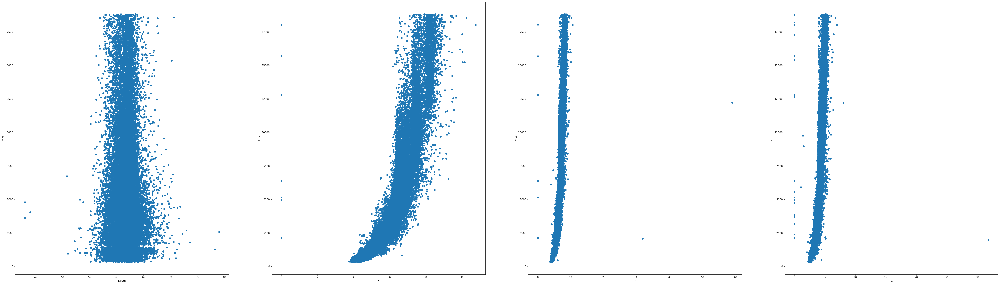

In [20]:
allGraphs=[]

fig, ax = plt.subplots(1, 4, figsize=(70, 20))
ax[0].scatter(x = df_mapped["depth"], y = df_mapped["price"])
ax[0].set_xlabel("Depth")
ax[0].set_ylabel("Price")

ax[1].scatter(x =df_mapped["x"], y=df_mapped["price"])
ax[1].set_xlabel("X")
ax[1].set_ylabel("Price")
                    
ax[2].scatter(x = df_mapped["y"], y = df_mapped["price"])
ax[2].set_xlabel("Y")
ax[2].set_ylabel("Price")

ax[3].scatter(x =df_mapped["z"], y=df_mapped["price"])
ax[3].set_xlabel("Z")
ax[3].set_ylabel("Price")

plt.show()

## **What happens if we remove the outliers?**

In [21]:
Q1 = df_mapped.quantile(0.25)
Q3 = df_mapped.quantile(0.75)
IQR=Q3-Q1
df_clean=df_mapped[~((df_mapped<(Q1-1.5*IQR))|(df_mapped>(Q3+1.5*IQR))).any(axis=1)]

# **Classification**

<Figure size 800x640 with 0 Axes>

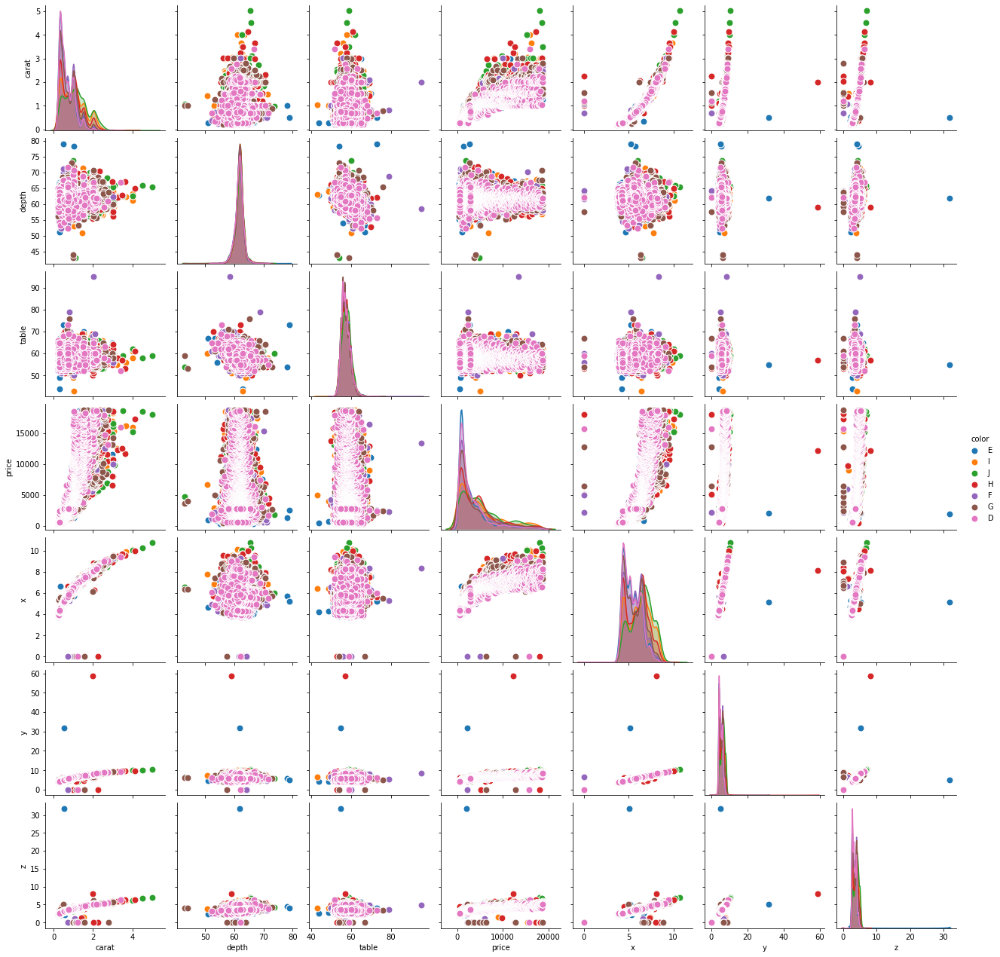

In [22]:
plt.figure(figsize=(10,8), dpi= 80)
sns.pairplot(df, kind="scatter", hue="color", plot_kws=dict(s=80, edgecolor="white", linewidth=1.0))
plt.show()

In [23]:
allSignificantAttr=["color", "carat"]
for i in allSignificantAttr:
    fig=px.histogram(df_mapped, x=i, y="price", facet_col="cut", histfunc="avg")
    fig.show()
    

In [33]:
def euclidean_distance(row1, row2):
    distance = 0.0
    for i in range(len(row1)-1):
        distance += (row1[i] - row2[i])**2
    return sqrt(distance)

In [34]:
# Locate the most similar neighbors
def get_neighbors(train, test_row, num_neighbors):
    distances = list()
    for train_row in train:
        dist = euclidean_distance(test_row, train_row)
        distances.append((train_row, dist))
    distances.sort(key=lambda tup: tup[1])
    neighbors = list()
    for i in range(num_neighbors):
        neighbors.append(distances[i][0])
    return neighbors


# neighbors = get_neighbors(dataset, dataset[0], 3)
# for neighbor in neighbors:
#     print(neighbor)

In [35]:
# Make a classification prediction with neighbors
def predict_classification(train, test_row, num_neighbors):
    neighbors = get_neighbors(train, test_row, num_neighbors)
    output_values = [row[-1] for row in neighbors]
    prediction = max(set(output_values), key=output_values.count)
    return prediction

# prediction = predict_classification(df, dataset[0], 3)
# print('Expected %d, Got %d.' % (df[0][-1], prediction))

In [36]:
set(df_mapped["clarity"])

{3, 4, 5, 6, 7, 8, 9, 10}

In [37]:
set(df_mapped["color"])

{1, 2, 3, 4, 5, 6, 7}

In [38]:
df_mapped

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,5,6,4,61.5,55.0,326,3.95,3.98,2.43
1,0.21,4,6,5,59.8,61.0,326,3.89,3.84,2.31
2,0.23,2,6,7,56.9,65.0,327,4.05,4.07,2.31
3,0.29,4,2,6,62.4,58.0,334,4.20,4.23,2.63
4,0.31,2,1,4,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,5,7,5,60.8,57.0,2757,5.75,5.76,3.50
53936,0.72,2,7,5,63.1,55.0,2757,5.69,5.75,3.61
53937,0.70,3,7,5,62.8,60.0,2757,5.66,5.68,3.56
53938,0.86,4,3,4,61.0,58.0,2757,6.15,6.12,3.74


In [39]:
def set_df_last_column(df, column_name):
    df_col=df.drop(column_name, axis=1)
    df_col[column_name]=df[column_name]
    return df_col


df_color=set_df_last_column(df_mapped, "cut")

X = df_color.iloc[:, :-1].values
y = df_color.iloc[:, len(df.columns)-1].values

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [41]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [42]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors=5)
classifier.fit(X_train, y_train)

KNeighborsClassifier()

In [43]:
y_pred = classifier.predict(X_test)

In [44]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[ 255   65    9   10    1]
 [  20  503  303   92   30]
 [   1  294  849  663  591]
 [   0   73  582 1831  294]
 [   4   15  316  247 3740]]
              precision    recall  f1-score   support

           1       0.91      0.75      0.82       340
           2       0.53      0.53      0.53       948
           3       0.41      0.35      0.38      2398
           4       0.64      0.66      0.65      2780
           5       0.80      0.87      0.83      4322

    accuracy                           0.67     10788
   macro avg       0.66      0.63      0.64     10788
weighted avg       0.65      0.67      0.66     10788



In [45]:
error = []

# Calculating error for K values between 1 and 40
for i in range(1, 11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    pred_i = knn.predict(X_test)
    error.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Mean Error')

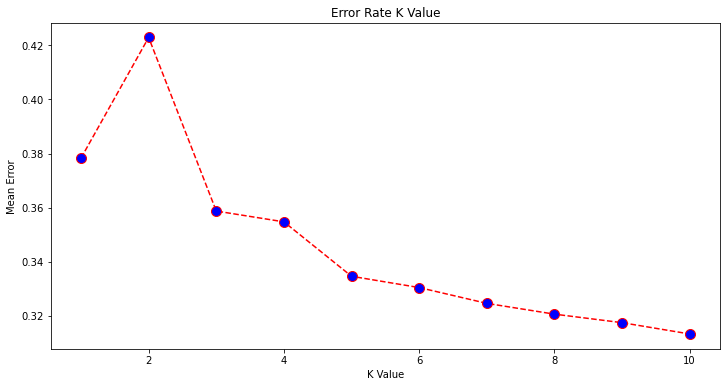

In [46]:
plt.figure(figsize=(12, 6))
plt.plot(range(1, 11), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')

## **SVM**

In [47]:
def getDatasetPatternsAndLabels(df, featureCount):
    patterns=[]
    labels=df.iloc[:, -1:].values.reshape(1,-1)[0]
    
    for i, row in df.iterrows():
        currentRow=[]
        for columnName in range(featureCount):
            currentRow.append(row[df.columns[columnName]])
        patterns.append(currentRow)
    
    return pd.DataFrame(patterns), pd.DataFrame(labels)[0]

In [48]:
feature_count = 5

dfCut = set_df_last_column(df_mapped, "clarity")
dataset_patterns, dataset_labels = getDatasetPatternsAndLabels(dfCut, feature_count)

# print(dfCut.columns)

# print('Shape patterns:', dataset_patterns.shape)
# print('Shape labels:', dataset_labels.shape)
# print(dataset_patterns.head())
# print(dataset_labels.head())

In [ ]:
train_x, validation_x, train_y, validation_y = train_test_split(dataset_patterns, dataset_labels, test_size=0.25)
print('Shape training set:', train_x.shape)
print('Shape validation set:', validation_x.shape)

In [ ]:
# Creazione di un classificatore
# clf = DummyClassifier(strategy='most_frequent')
clf = SVC(kernel="linear", C=1)
# clf = SVC(kernel="rbf", C=1, gamma=0.1)

# Addestramento
clf.fit(train_x, train_y)

print('Classi predette:', clf.predict(validation_x[0:20]))
print('Classi reali:', validation_y[0:20])

In [ ]:
# Uso della funzione .score(...)
print('Accuratezza sul training set: %.3f' % clf.score(train_x, train_y))
print('Accuratezza sul validation set: %.3f' % clf.score(validation_x, validation_y))

In [ ]:
# Uso di show_results
# ml_visualization.show_2D_results(clf, (train_x, train_y, 'Training'), (validation_x, validation_y, 'Validation'))